In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier,ExtraTreesClassifier
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,roc_curve,auc
import warnings
warnings.filterwarnings('ignore')

In [2]:
fraud=pd.read_csv('Automobile insurance fraud.csv')
fraud

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
fraud.shape

(1000, 40)

In [4]:
fraud.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [5]:
fraud.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

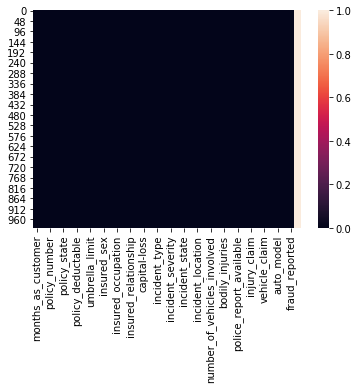

In [6]:
sns.heatmap(fraud.isnull())

In [7]:
fraud.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [8]:
fraud['fraud_reported'].value_counts()


N    753
Y    247
Name: fraud_reported, dtype: int64

In [9]:
fraud.columns


Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [10]:
fraud.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


# From the above statistical table we can understand: We can see that for each column we have the following functions

In [11]:
fraud.drop(['_c39'],axis=1,inplace=True)
#lets drop the _c39 column as it is irrelevant

In [12]:
fraud.drop(['policy_number'],axis=1,inplace=True)

In [13]:
fraud['policy_bind_date'].head()

0    17-10-2014
1    27-06-2006
2    06-09-2000
3    25-05-1990
4    06-06-2014
Name: policy_bind_date, dtype: object

In [14]:
#changing the date format 
fraud['policy_bind_day']=fraud['policy_bind_date'].str.split('-').str[0].astype(int)
fraud['policy_bind_month']=fraud['policy_bind_date'].str.split('-').str[1].astype(int)
fraud['policy_bind_year']=fraud['policy_bind_date'].str.split('-').str[2].astype(int)

In [15]:
fraud.drop(['policy_bind_date'],axis=1,inplace=True)

In [16]:
fraud['policy_state'].value_counts()


OH    352
IL    338
IN    310
Name: policy_state, dtype: int64

In [17]:
le=LabelEncoder()
fraud['policy_state']=le.fit_transform(fraud['policy_state'])

In [18]:
fraud['policy_csl'].value_counts()

250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64

In [19]:
fraud['policy_csl']=le.fit_transform(fraud['policy_csl'])

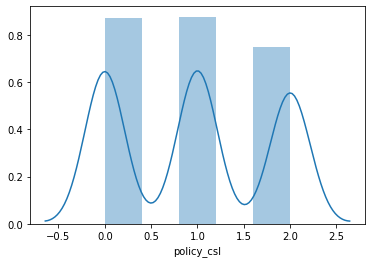

In [76]:
sns.distplot(fraud['policy_csl'])

In [20]:
fraud['insured_sex'].value_counts()

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64

In [21]:
fraud['insured_sex']=le.fit_transform(fraud['insured_sex'])

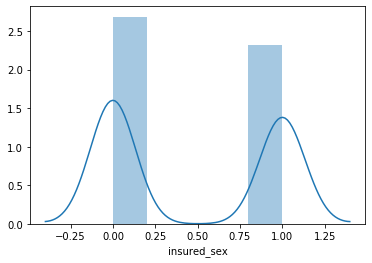

In [77]:
sns.distplot(fraud['insured_sex'])

In [22]:
fraud['insured_education_level'].value_counts()

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64

In [23]:
fraud['insured_education_level']=le.fit_transform(fraud['insured_education_level'])

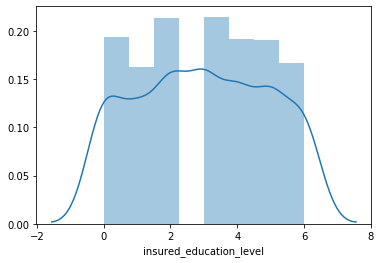

In [78]:
sns.distplot(fraud['insured_education_level'])

In [24]:
fraud['insured_occupation'].value_counts()

machine-op-inspct    93
prof-specialty       85
tech-support         78
exec-managerial      76
sales                76
craft-repair         74
transport-moving     72
priv-house-serv      71
other-service        71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64

In [25]:
fraud['insured_occupation']=le.fit_transform(fraud['insured_occupation'])

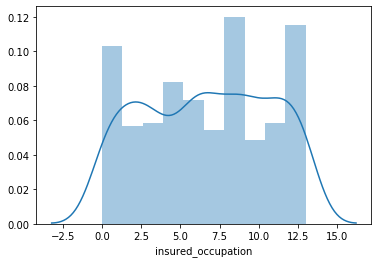

In [79]:
sns.distplot(fraud['insured_occupation'])

In [26]:
fraud['insured_hobbies'].value_counts()

reading           64
paintball         57
exercise          57
bungie-jumping    56
golf              55
camping           55
movies            55
kayaking          54
yachting          53
hiking            52
video-games       50
base-jumping      49
skydiving         49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64

In [27]:
fraud['insured_hobbies']=le.fit_transform(fraud['insured_hobbies'])

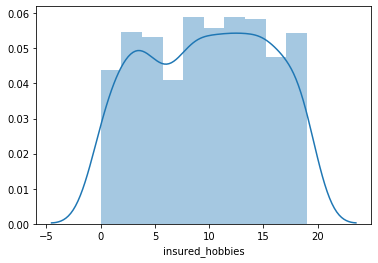

In [80]:
sns.distplot(fraud['insured_hobbies'])

In [28]:
fraud['insured_relationship'].value_counts()

own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64

In [29]:
fraud['insured_relationship']=le.fit_transform(fraud['insured_relationship'])

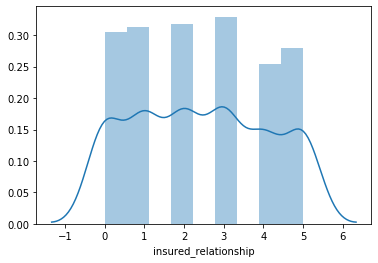

In [81]:
sns.distplot(fraud['insured_relationship'])

In [30]:
fraud['incident_date'].head()

0    25-01-2015
1    21-01-2015
2    22-02-2015
3    10-01-2015
4    17-02-2015
Name: incident_date, dtype: object

In [31]:
fraud['incident_day']=fraud['incident_date'].str.split('-').str[0].astype(int)
fraud['incident_month']=fraud['incident_date'].str.split('-').str[1].astype(int)
fraud['incident_year']=fraud['incident_date'].str.split('-').str[2].astype(int)

In [32]:
fraud.drop(['incident_date'],axis=1,inplace=True)

In [33]:
fraud['incident_type']=le.fit_transform(fraud['incident_type'])

In [34]:
fraud['incident_type'].value_counts()

0    419
2    403
3     94
1     84
Name: incident_type, dtype: int64

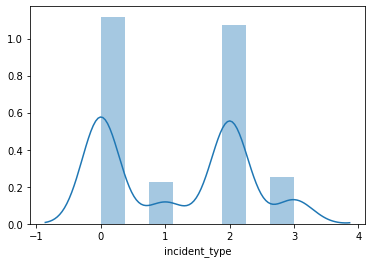

In [82]:
sns.distplot(fraud['incident_type'])

In [35]:
fraud['collision_type'].value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64

In [36]:
fraud['collision_type'].replace(['?'],['None'],inplace=True)

In [37]:
fraud['collision_type']=le.fit_transform(fraud['collision_type'])

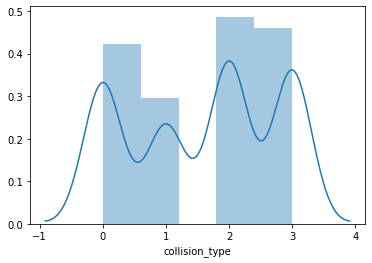

In [83]:
sns.distplot(fraud['collision_type'])

In [38]:
fraud['incident_severity']=le.fit_transform(fraud['incident_severity'])

In [39]:
fraud['authorities_contacted'].value_counts()

Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64

In [40]:
fraud['authorities_contacted']=le.fit_transform(fraud['authorities_contacted'])

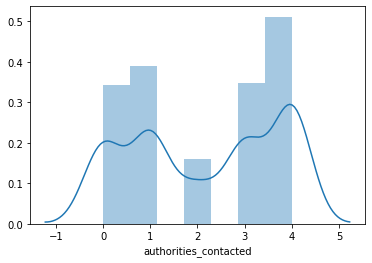

In [84]:
sns.distplot(fraud['authorities_contacted'])

In [41]:
fraud['incident_state'].value_counts()

NY    262
SC    248
WV    217
NC    110
VA    110
PA     30
OH     23
Name: incident_state, dtype: int64

In [42]:
fraud['incident_state']=le.fit_transform(fraud['incident_state'])

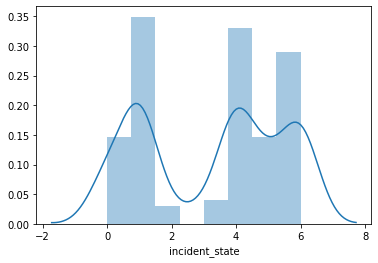

In [85]:
sns.distplot(fraud['incident_state'])

In [43]:
fraud['incident_city'].value_counts()

Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64

In [44]:
fraud['incident_city']=le.fit_transform(fraud['incident_city'])

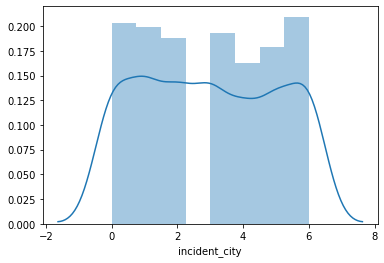

In [86]:
sns.distplot(fraud['incident_city'])

In [45]:
fraud['incident_location'].value_counts()

3751 Tree Hwy        1
5022 1st St          1
1923 2nd Hwy         1
2646 MLK Drive       1
9488 Best Drive      1
                    ..
5224 5th Lane        1
5667 4th Drive       1
3553 Texas Ave       1
7756 Pine Hwy        1
8579 Apache Drive    1
Name: incident_location, Length: 1000, dtype: int64

In [46]:
fraud['incident_location'].head()

0       9935 4th Drive
1         6608 MLK Hwy
2    7121 Francis Lane
3     6956 Maple Drive
4         3041 3rd Ave
Name: incident_location, dtype: object

In [47]:
fraud.drop(['incident_location'],axis=1,inplace=True)

In [48]:
fraud['property_damage'].value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

In [49]:
fraud['property_damage'].replace(['?'],['None'],inplace=True)
fraud['property_damage']=le.fit_transform(fraud['property_damage'])

In [50]:
fraud['police_report_available'].value_counts()

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

In [51]:
fraud['police_report_available'].replace(['?'],['None'],inplace=True)

In [52]:
fraud['police_report_available']=le.fit_transform(fraud['police_report_available'])

In [53]:
fraud['auto_make'].value_counts()

Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
BMW           72
Ford          72
Toyota        70
Audi          69
Volkswagen    68
Accura        68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64

In [54]:
fraud['auto_make']=le.fit_transform(fraud['auto_make'])

In [55]:
fraud['auto_model'].value_counts()

RAM               43
Wrangler          42
Neon              37
A3                37
MDX               36
Jetta             35
Passat            33
Legacy            32
A5                32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
E400              27
F150              27
95                27
93                25
Grand Cherokee    25
Maxima            24
Tahoe             24
Escape            24
X5                23
Ultima            23
Highlander        22
Civic             22
Silverado         22
Fusion            21
TL                20
ML350             20
Impreza           20
Corolla           20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64

In [56]:
fraud['auto_model']=le.fit_transform(fraud['auto_model'])

In [57]:
fraud['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

In [58]:
fraud['fraud_reported']=le.fit_transform(fraud['fraud_reported'])

In [87]:
sns.pairplot(fraud)

In [59]:
fraud.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 41 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   int32  
 3   policy_csl                   1000 non-null   int32  
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_zip                  1000 non-null   int64  
 8   insured_sex                  1000 non-null   int32  
 9   insured_education_level      1000 non-null   int32  
 10  insured_occupation           1000 non-null   int32  
 11  insured_hobbies              1000 non-null   int32  
 12  insured_relationship         1000 non-null   int32  
 13  capital-gains      

In [60]:
fraud.shape

(1000, 41)

In [61]:
fraud['fraud_reported'].value_counts()

0    753
1    247
Name: fraud_reported, dtype: int64

In [62]:
from sklearn.utils import resample
fraud_0 = fraud[fraud['fraud_reported']==0]
fraud_1 = fraud[fraud['fraud_reported']==1]

fraud_1_ups = resample(fraud_1,replace=True,n_samples=753,random_state=123) 
 
fraud_new = pd.concat([fraud_0, fraud_1_ups])

In [63]:
fraud_new.shape

(1506, 41)

In [64]:
fraud_new['fraud_reported'].value_counts()

1    753
0    753
Name: fraud_reported, dtype: int64

In [65]:
x=fraud_new.drop(['fraud_reported'],axis=1)
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,vehicle_claim,auto_make,auto_model,auto_year,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,incident_year
2,134,29,2,0,2000,1413.14,5000000,430632,0,6,...,23100,4,30,2007,6,9,2000,22,2,2015
4,228,44,0,2,1000,1583.91,6000000,610706,1,0,...,4550,0,31,2009,6,6,2014,17,2,2015
6,137,34,1,1,1000,1333.35,0,441716,1,6,...,50050,9,29,2012,4,6,2000,13,1,2015
7,165,37,0,0,1000,1137.03,0,603195,1,0,...,32830,1,5,2015,3,2,1990,27,2,2015
8,27,33,0,0,500,1442.99,0,601734,0,6,...,22160,12,9,2012,5,2,1997,30,1,2015


In [66]:
ss=StandardScaler()
x=ss.fit_transform(x)

In [68]:
y=fraud_new['fraud_reported']
y.head()

2    0
4    0
6    0
7    0
8    0
Name: fraud_reported, dtype: int32

In [69]:
from sklearn.model_selection import train_test_split,cross_val_score
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=56,stratify=y)

In [70]:
print(x_train.shape,x_test.shape)

(1054, 40) (452, 40)


In [71]:
KNN=KNeighborsClassifier()
SV=SVC()
LR=LogisticRegression()
DT=DecisionTreeClassifier(random_state=56)
GNB=GaussianNB()
RFC=RandomForestClassifier(n_estimators=200,random_state=56)
GBC=GradientBoostingClassifier(n_estimators=200,random_state=56)
ABC=AdaBoostClassifier(random_state=56)
ETC=ExtraTreesClassifier(random_state=56)

models = []

models.append(('KNeighborsClassifier', KNN))
models.append(('SVC', SV))
models.append(('LogisticRegression', LR))
models.append(('DecisionTreeClassifier', DT))
models.append(('GaussianNB', GNB))
models.append(('RandomForestClassifier', RFC))
models.append(('GradientBoostingClassifier', GBC))
models.append(('ExtraTreesClassifier',ETC))
models.append(('AdaBoostClassifier',ABC))

*********************** KNeighborsClassifier ***********************


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')


Accuracy_score =  0.6592920353982301


Cross_Val_Score =  0.705916114790287


roc_auc_score =  0.6592920353982301


classification_report
               precision    recall  f1-score   support

           0       0.70      0.55      0.62       226
           1       0.63      0.77      0.69       226

    accuracy                           0.66       452
   macro avg       0.67      0.66      0.66       452
weighted avg       0.67      0.66      0.66       452



[[124 102]
 [ 52 174]]


AxesSubplot(0.125,0.808774;0.62x0.0712264)



*********************** SVC ***********************


SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf'

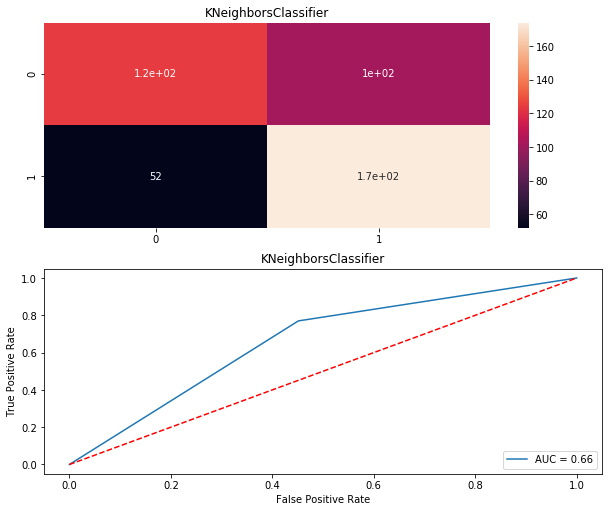

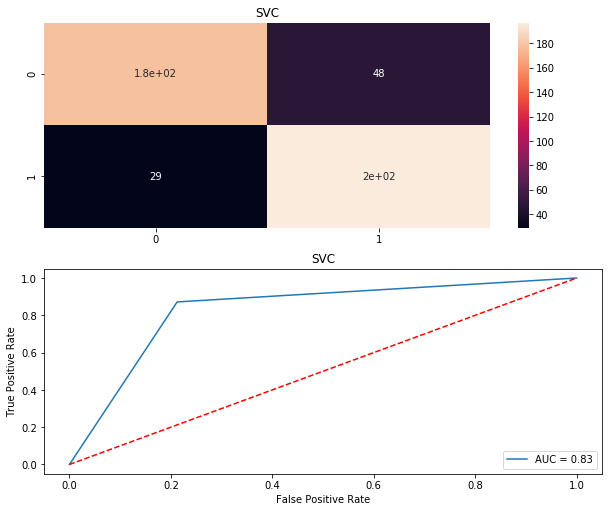

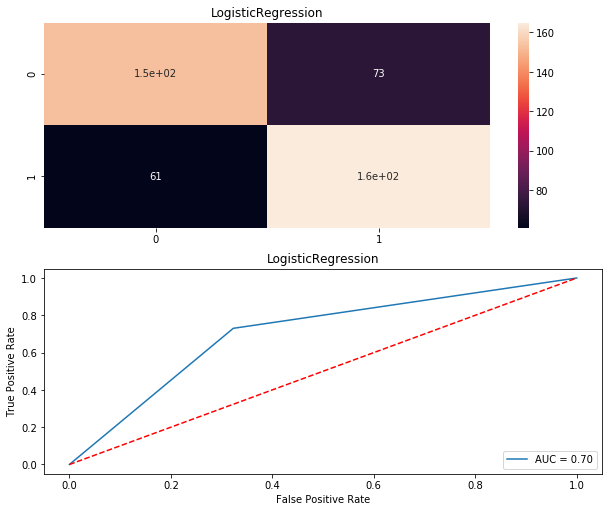

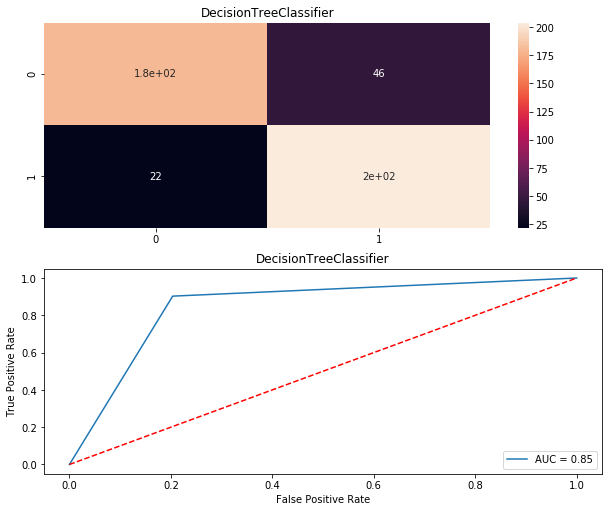

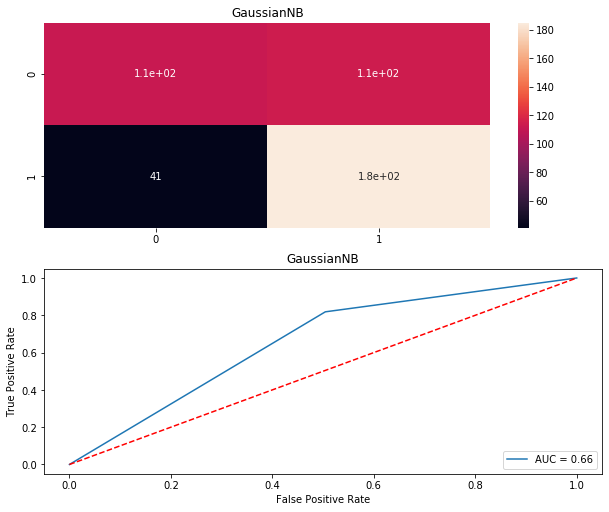

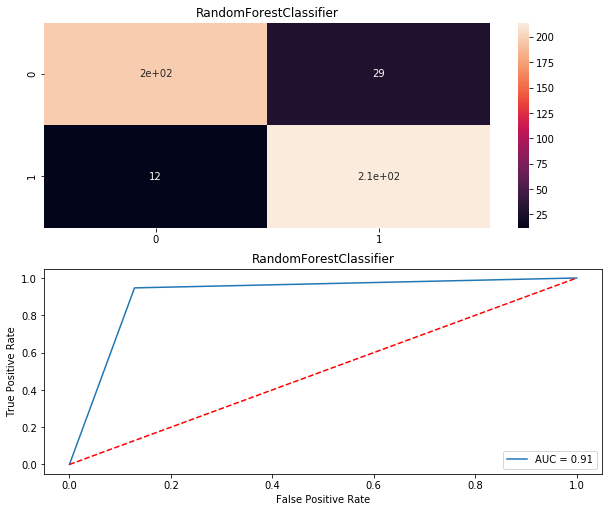

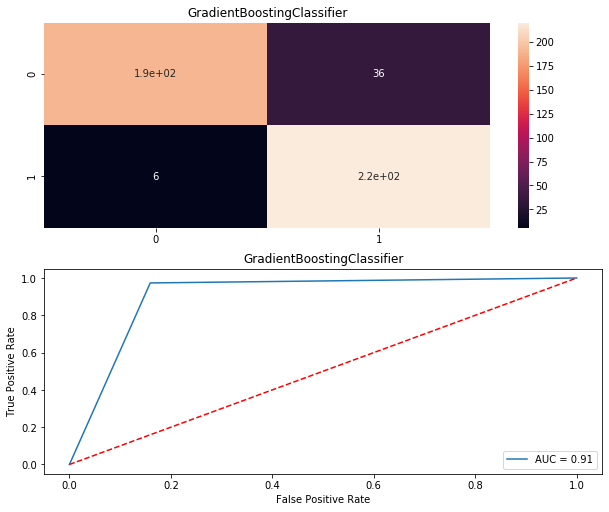

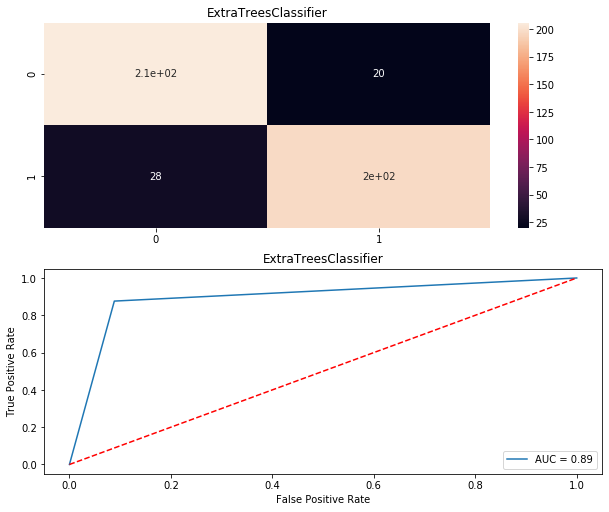

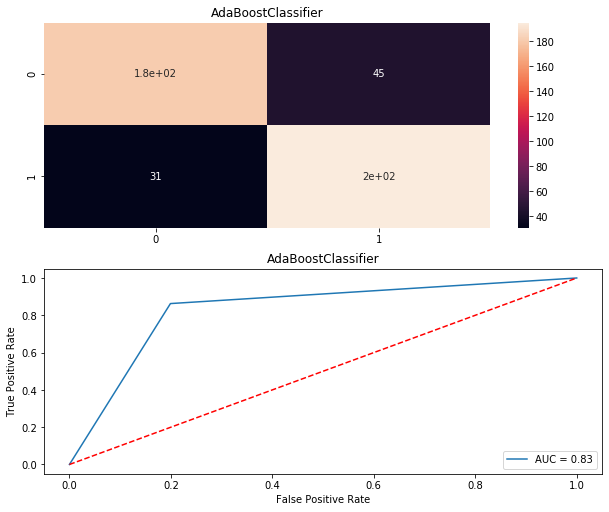

In [73]:
Model = []
score = []
cvs=[]
rocscore=[]
for name,model in models:
    print('***********************',name,'***********************')
    print('\n')
    Model.append(name)
    model.fit(x_train,y_train)
    print(model)
    pre=model.predict(x_test)
    print('\n')
    AS=accuracy_score(y_test,pre)
    print('Accuracy_score = ',AS)
    score.append(AS*100)
    print('\n')
    sc = cross_val_score(model, x, y, cv=10, scoring='accuracy').mean()
    print('Cross_Val_Score = ',sc)
    cvs.append(sc*100)
    print('\n')
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test,pre)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    print ('roc_auc_score = ',roc_auc)
    rocscore.append(roc_auc*100)
    print('\n')
    print('classification_report\n',classification_report(y_test,pre))
    print('\n')
    cm=confusion_matrix(y_test,pre)
    print(cm)
    print('\n')
    plt.figure(figsize=(10,40))
    plt.subplot(911)
    plt.title(name)
    print(sns.heatmap(cm,annot=True))
    plt.subplot(912)
    plt.title(name)
    plt.plot(false_positive_rate, true_positive_rate, label='AUC = %0.2f'% roc_auc)
    plt.plot([0,1],[0,1],'r--')
    plt.legend(loc='lower right')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    print('\n\n')

In [74]:
result = pd.DataFrame({'Model': Model, 'Accuracy_score': score ,'Cross_val_score':cvs,'Roc_auc_curve':rocscore})
result


,Model,Accuracy_score,Cross_val_score,Roc_auc_curve
0,KNeighborsClassifier,65.929204,70.591611,65.929204
1,SVC,82.964602,85.796468,82.964602
2,LogisticRegression,70.353982,72.581898,70.353982
3,DecisionTreeClassifier,84.955752,91.105960,84.955752
4,GaussianNB,65.707965,69.466667,65.707965
5,RandomForestClassifier,90.929204,92.566004,90.929204
6,GradientBoostingClassifier,90.707965,92.566887,90.707965
7,ExtraTreesClassifier,89.380531,94.691832,89.380531
8,AdaBoostClassifier,83.185841,84.334658,83.185841


In [75]:
from sklearn.externals import joblib
joblib.dump(RFC,"model_Insurance_fraud.pkl")

['model_Insurance_fraud.pkl']